In [105]:
from pymongo import MongoClient

client = MongoClient('localhost', 27017)
mongo = client.hai

In [368]:
import time
time.time()

1510935186.9657946

In [487]:
start_time = 1510935186
end_time = 1510947178
username = "sean"

In [488]:
query = {"user_name": username, "pose":{"$exists": True}, "detections":{"$exists": True}, "time": {"$gt": start_time, "$lt": time.time()}}
cams = mongo.images.find(query).distinct("cam_id")
print(cams)

['nakacam1', 'nakacam0']


In [489]:
import os
import sys

sys.path.append("..")
os.chdir("/home/sean/HAI/main_server/hai")

In [493]:
query = {"user_name": username, "time": {"$gt": start_time, "$lt": time.time()}}
print_data = list(mongo.print.find(query))
print(len(print_data))
print(print_data)

11
[{'_id': ObjectId('5a0f0aec1d41c8162a809c1d'), 'user_name': 'sean', 'text': 'bed', 'time': 1510935276.5838656}, {'_id': ObjectId('5a0f0b2e1d41c8162a809c41'), 'user_name': 'sean', 'text': 'watch', 'time': 1510935342.7840571}, {'_id': ObjectId('5a0f0b7f1d41c8162a809c6b'), 'user_name': 'sean', 'text': 'laptop', 'time': 1510935423.8563461}, {'_id': ObjectId('5a0f0be51d41c8162a809ca5'), 'user_name': 'sean', 'text': 'study', 'time': 1510935525.7488253}, {'_id': ObjectId('5a0f29781d41c86ac36021d4'), 'user_name': 'sean', 'text': 'bed', 'time': 1510943096.4408247}, {'_id': ObjectId('5a0f39691d41c82ff2abf250'), 'user_name': 'sean', 'text': 'bed', 'time': 1510947177.6962345}, {'_id': ObjectId('5a0f39c01d41c82ff2abf286'), 'user_name': 'sean', 'text': 'watch', 'time': 1510947264.756206}, {'_id': ObjectId('5a0f3c971d41c82ff2abf45a'), 'user_name': 'sean', 'text': 'bed', 'time': 1510947991.942963}, {'_id': ObjectId('5a0f3d291d41c82ff2abf4bf'), 'user_name': 'sean', 'text': 'study', 'time': 151094813

In [527]:
%load_ext autoreload
%autoreload 2

import scipy.misc
import matplotlib.pyplot as plt
import controllers.learner.datasets as ds
ds.port = 27017

%matplotlib inline

image_data = ds.get_event_images2(username, print_data, cams, start_offset=0, end_offset=30, stride=3, size=5, skip_incomplete=True)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
skipped: 9 picked: 90


In [528]:
print(len(print_data), len(image_data))
print([len(x) for x in image_data])

11 11
[9, 9, 9, 9, 9, 6, 6, 9, 9, 7, 8]


In [529]:
x, y, classes, images, boxes = ds.generate_image_event_dataset(image_data, print_data, len(cams), None, augs=-1, crop_augs=-1)

90 90
180 180 90 180
180 2


90 90
bed


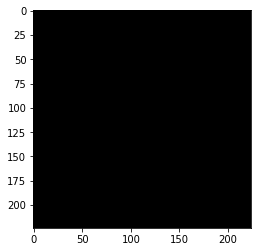

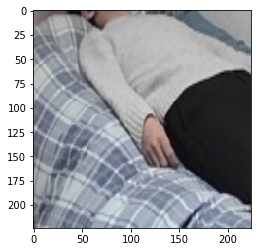

bed


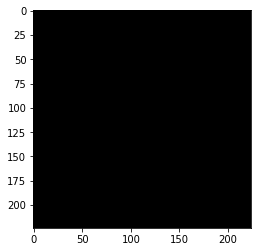

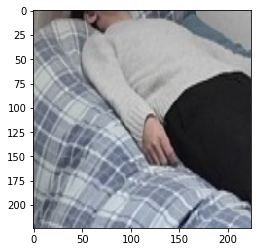

bed


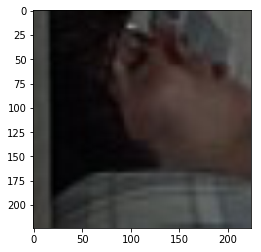

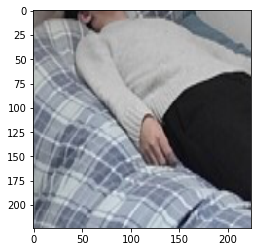

bed


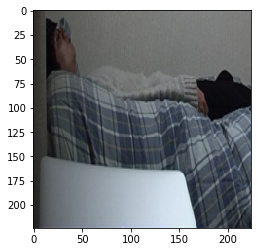

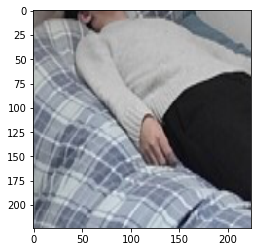

bed


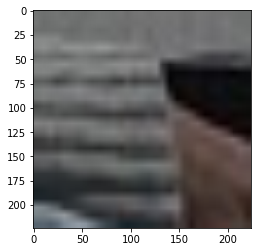

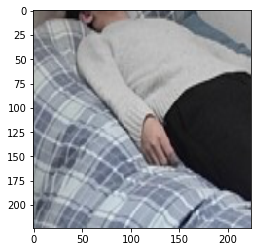

bed


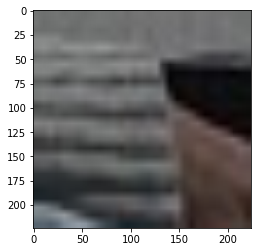

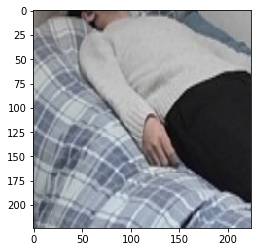

bed


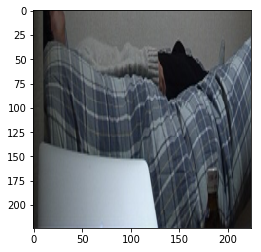

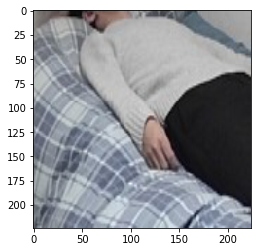

bed


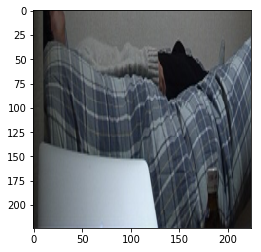

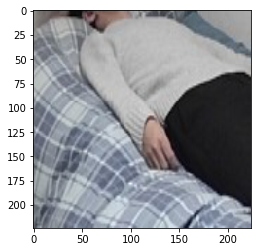

bed


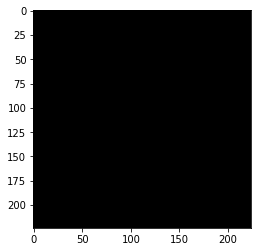

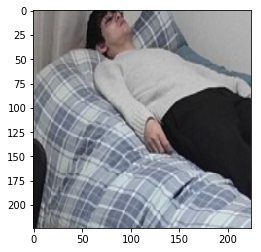

watch


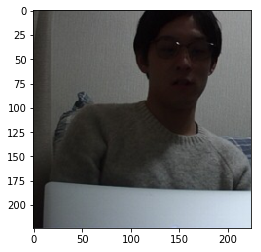

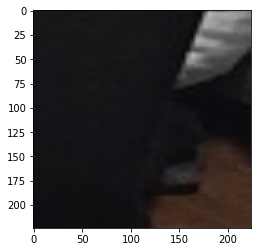

watch


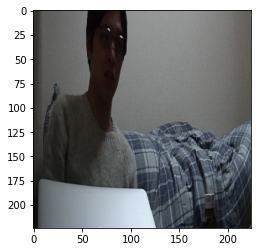

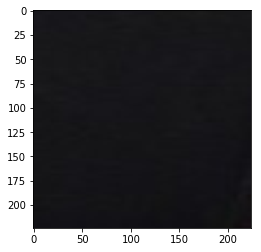

watch


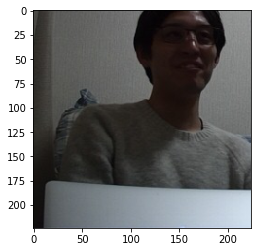

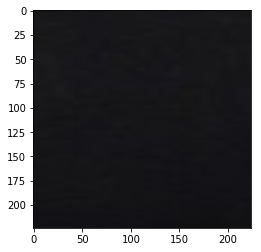

watch


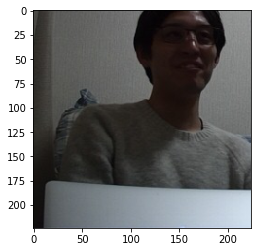

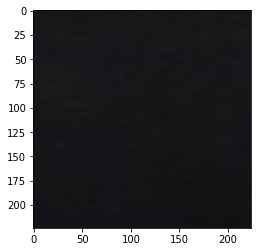

watch


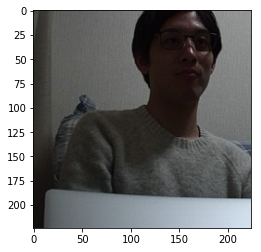

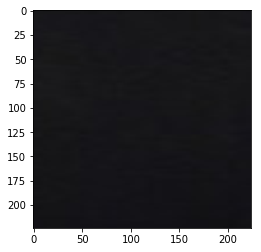

watch


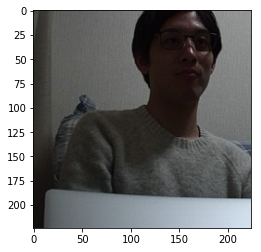

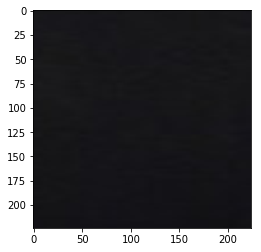

watch


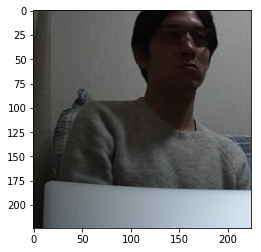

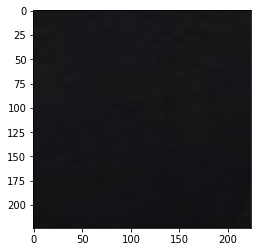

watch


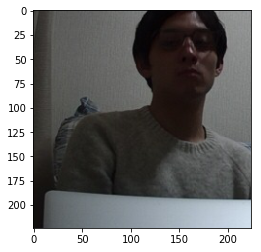

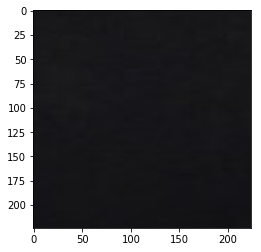

watch


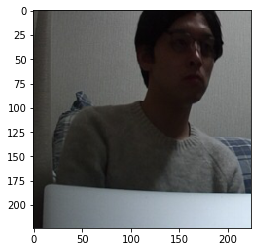

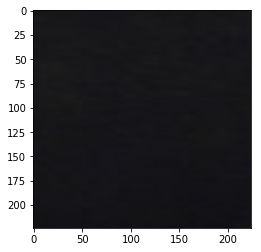

laptop


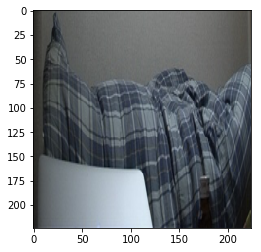

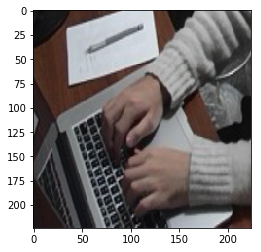

laptop


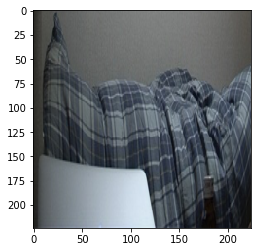

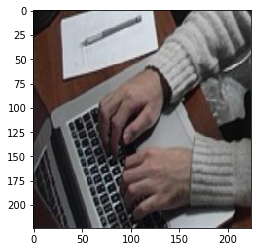

laptop


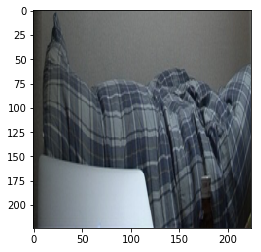

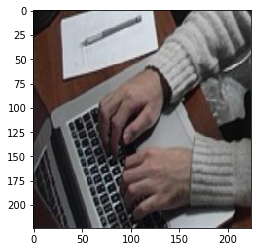

laptop


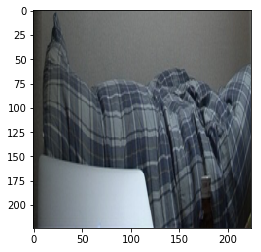

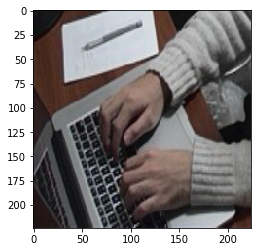

laptop


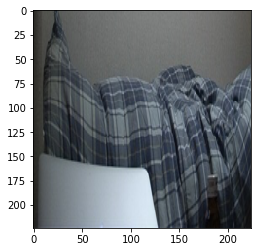

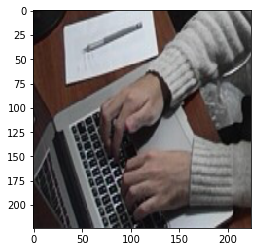

laptop


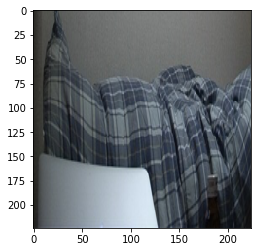

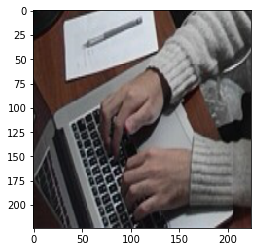

laptop


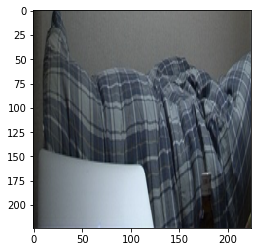

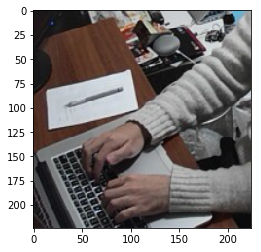

laptop


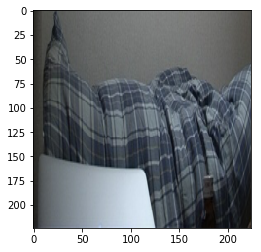

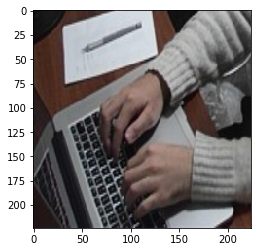

laptop


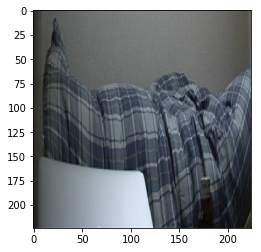

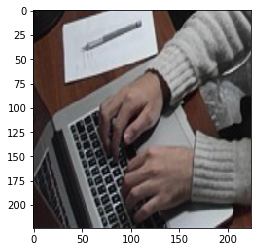

study


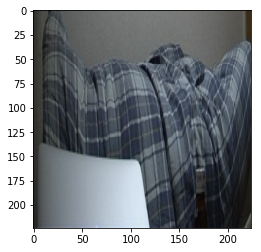

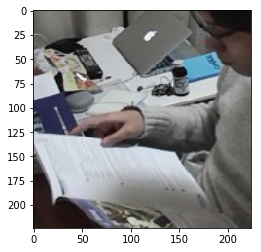

study


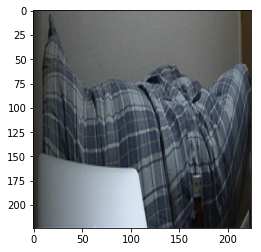

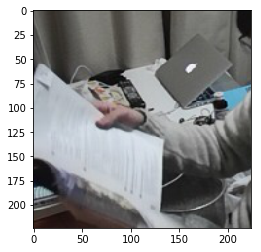

study


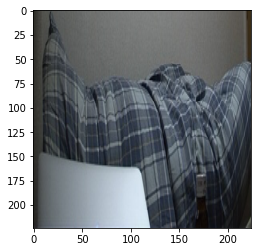

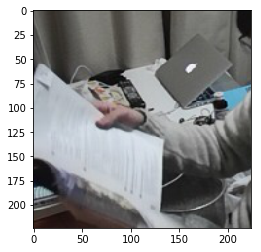

study


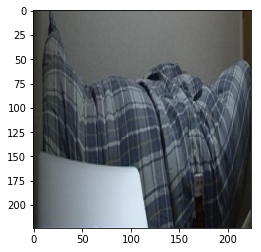

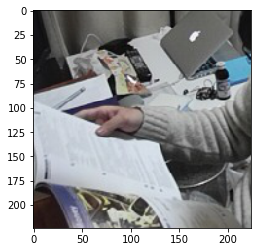

study


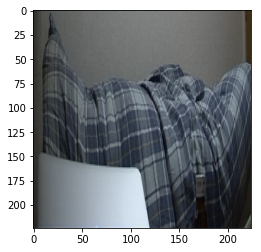

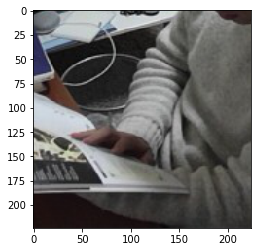

study


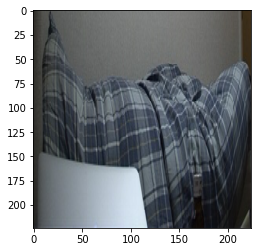

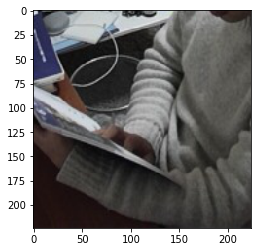

study


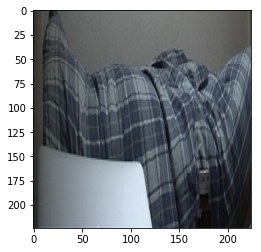

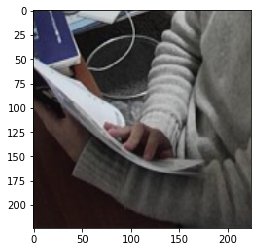

study


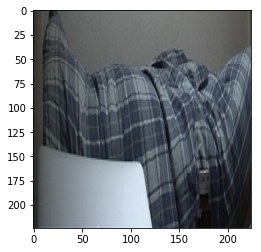

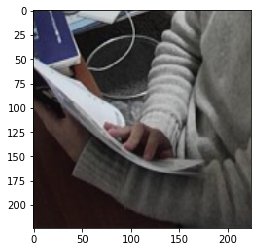

study


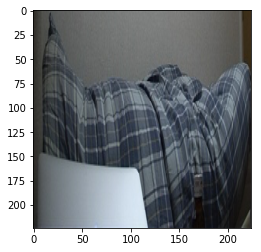

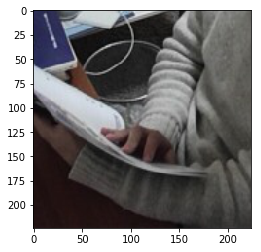

bed


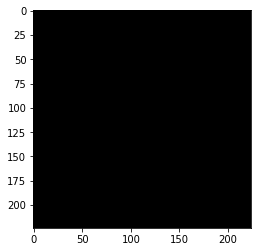

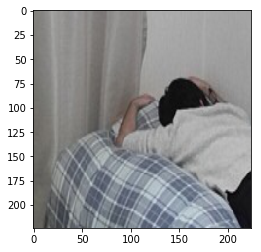

bed


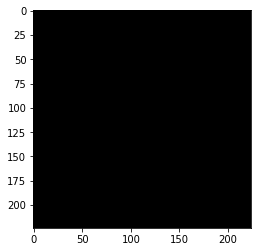

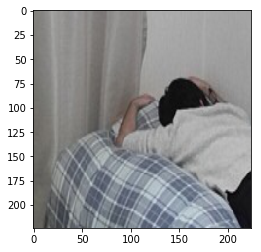

bed


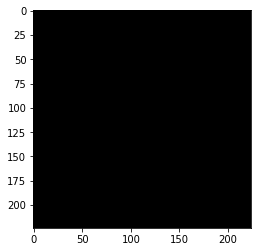

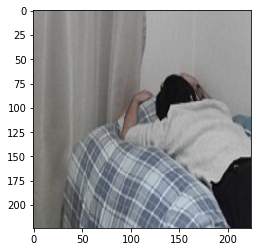

bed


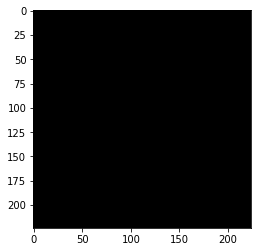

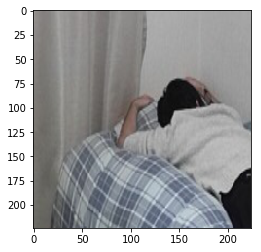

bed


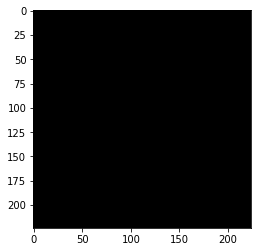

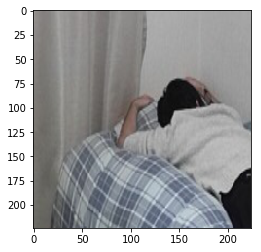

bed


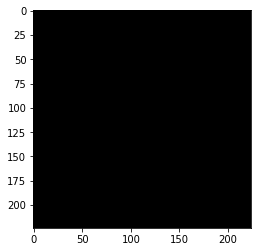

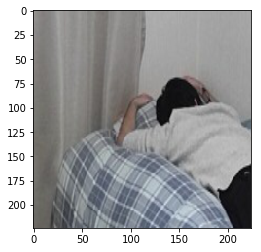

bed


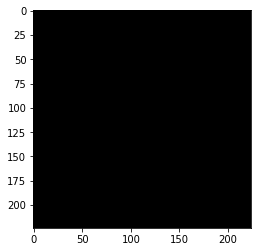

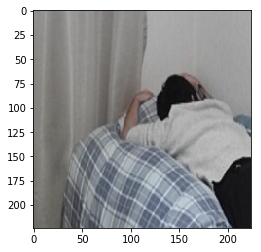

bed


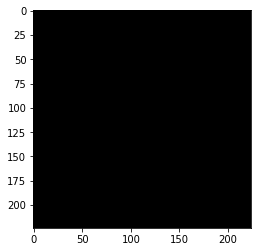

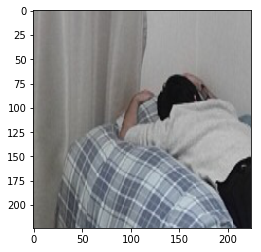

bed


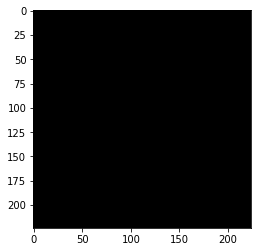

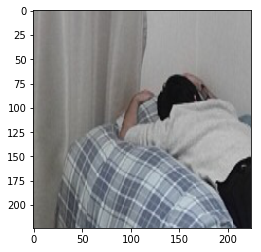

bed


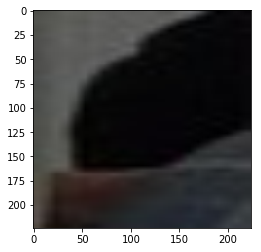

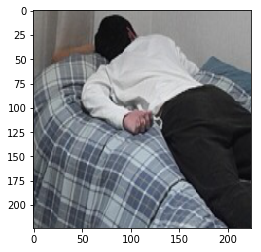

bed


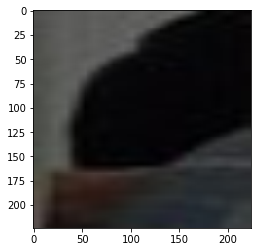

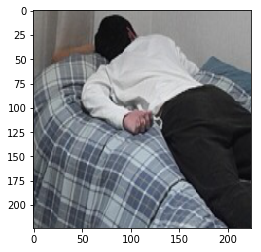

bed


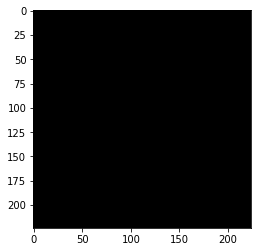

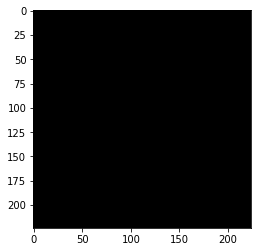

bed


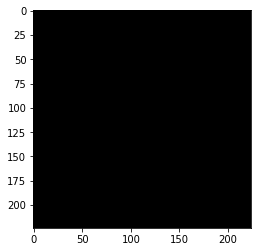

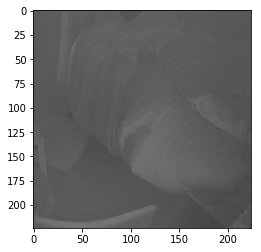

bed


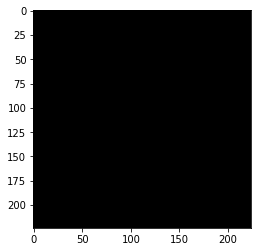

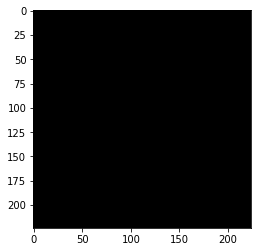

bed


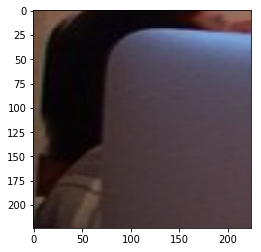

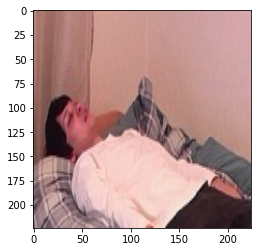

watch


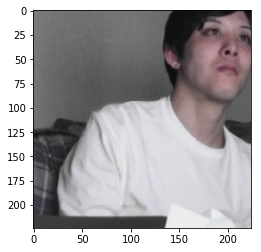

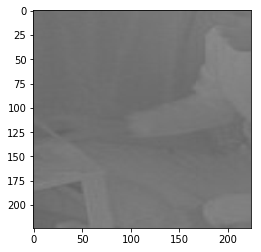

watch


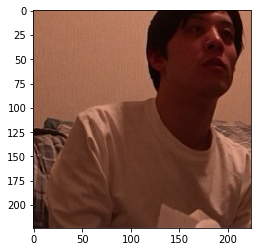

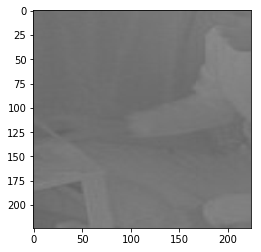

watch


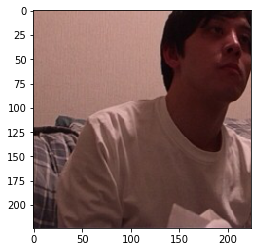

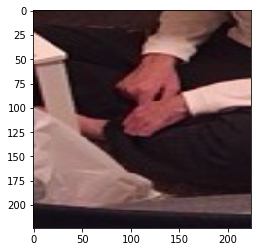

watch


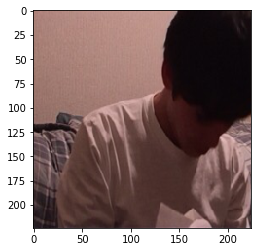

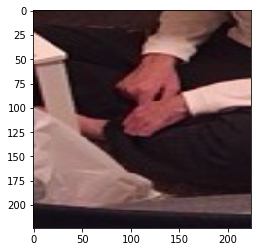

watch


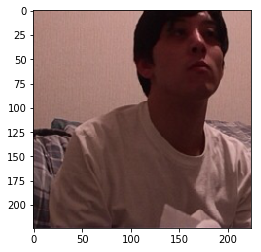

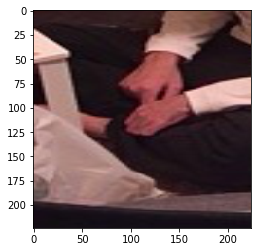

watch


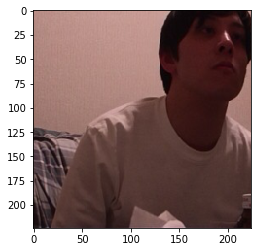

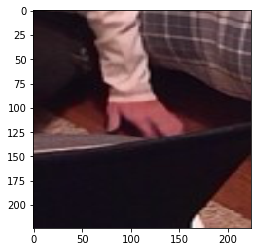

bed


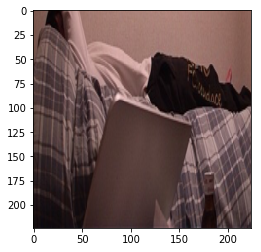

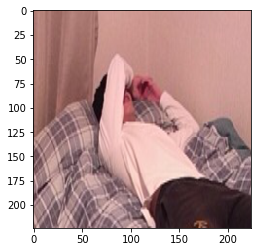

bed


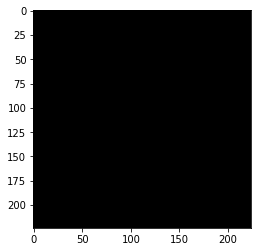

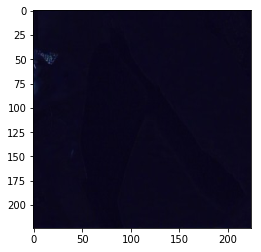

bed


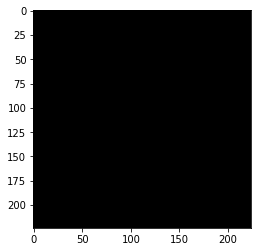

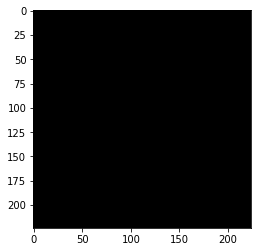

bed


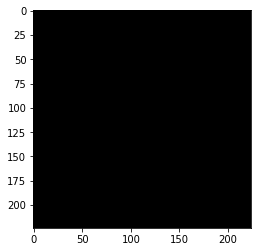

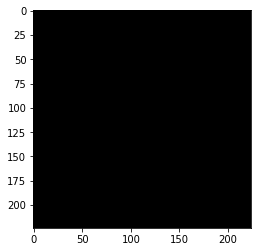

bed


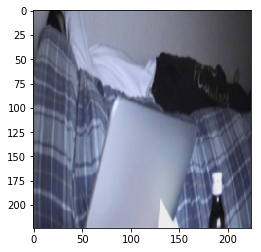

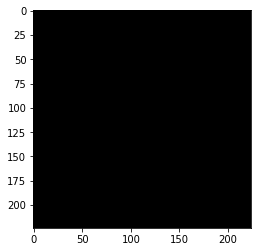

bed


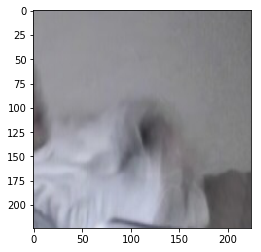

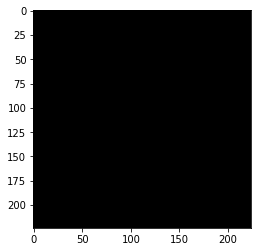

bed


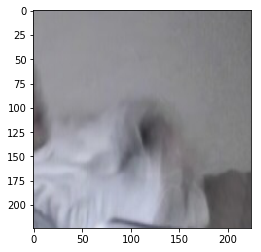

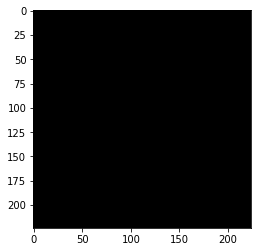

bed


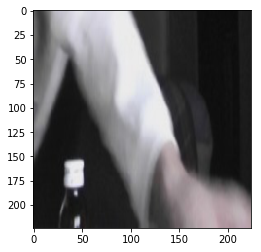

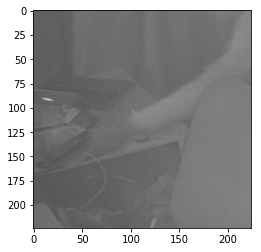

bed


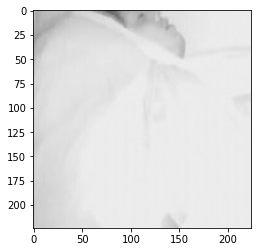

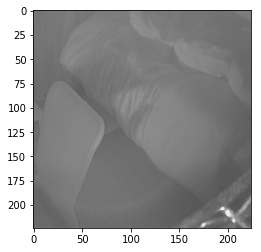

study


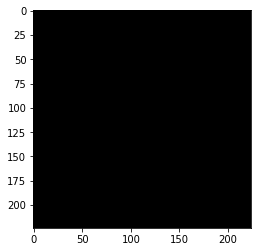

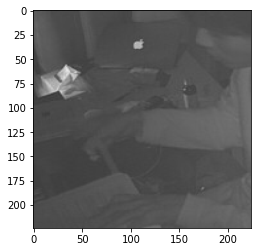

study


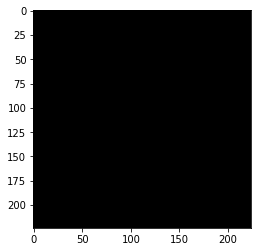

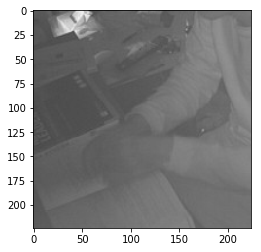

study


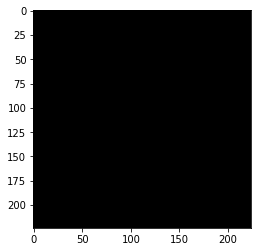

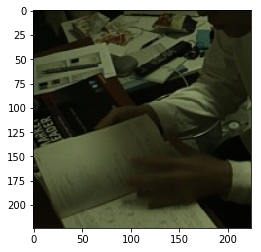

study


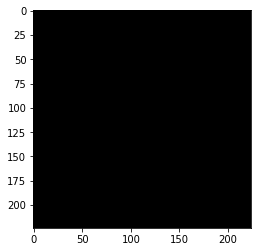

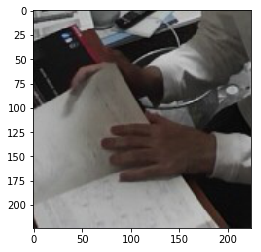

study


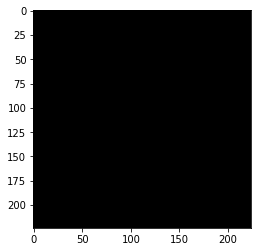

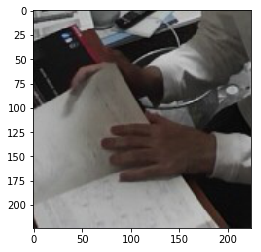

study


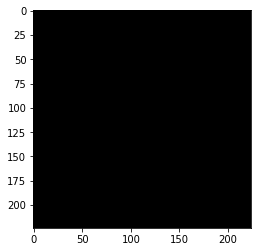

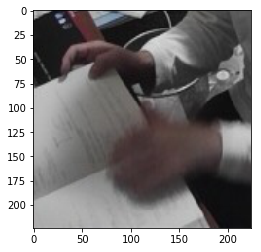

study


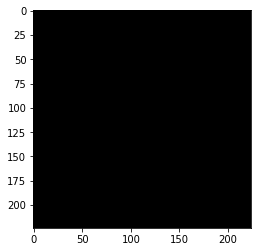

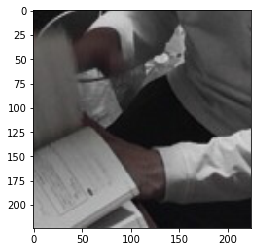

study


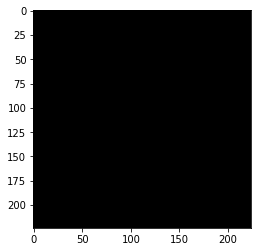

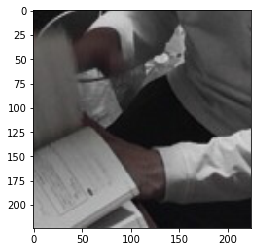

study


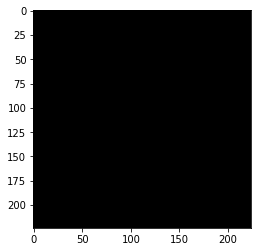

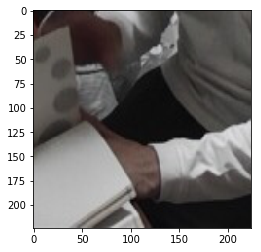

laptop


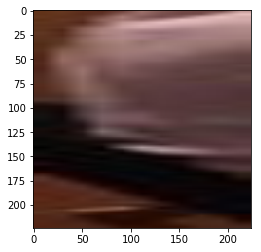

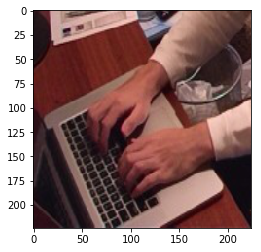

laptop


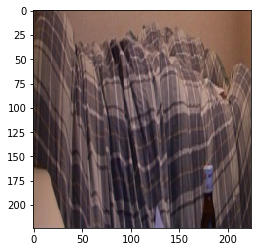

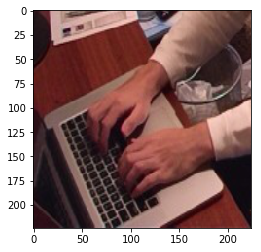

laptop


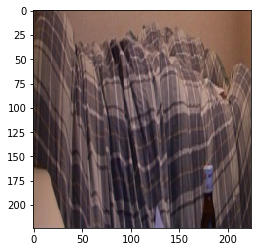

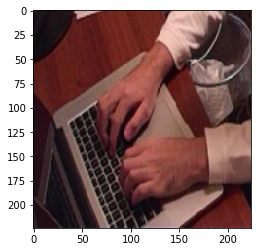

laptop


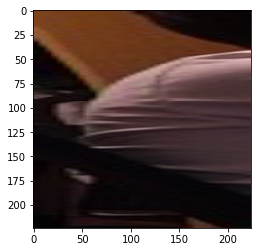

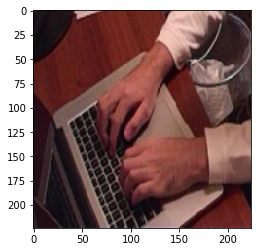

laptop


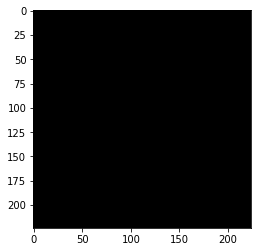

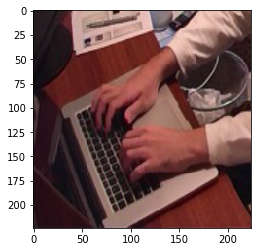

laptop


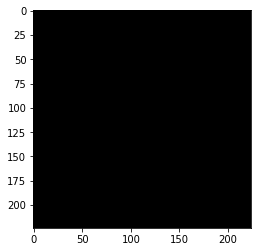

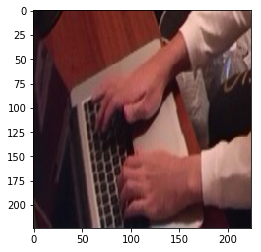

laptop


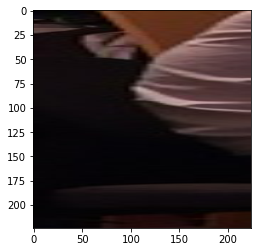

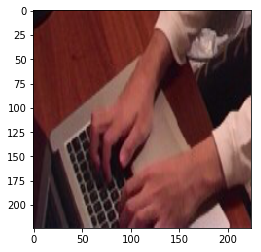

study


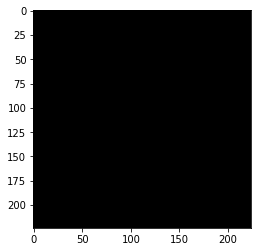

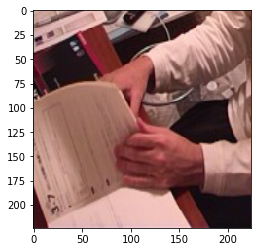

study


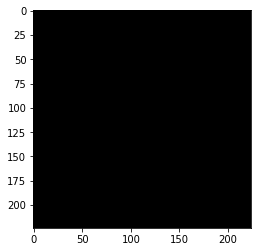

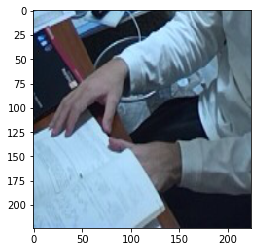

study


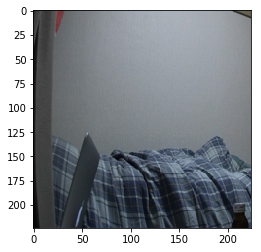

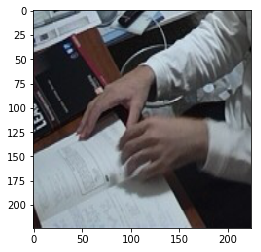

study


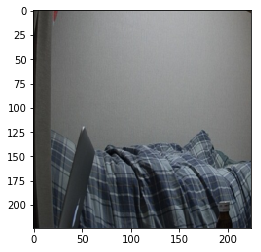

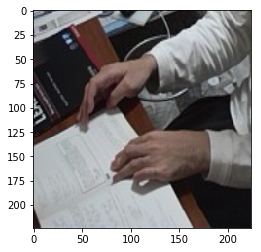

study


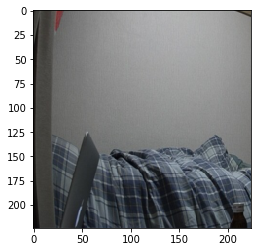

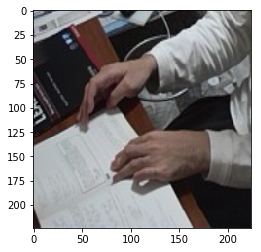

study


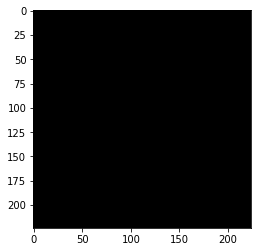

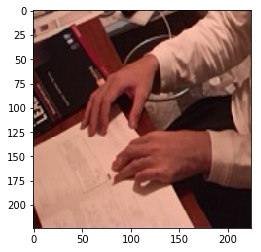

study


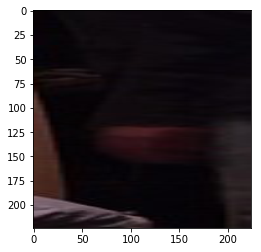

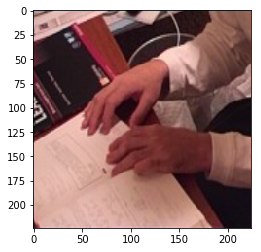

study


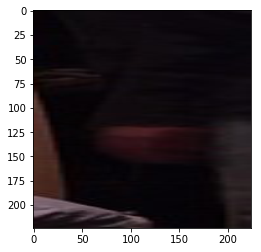

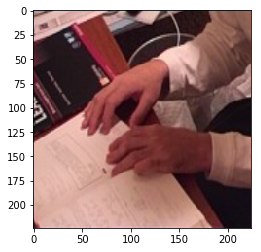

In [530]:
import numpy as np

print(len(y), len(images))

for label, row in zip(y, images):
    print(classes[label])
    for image in row:
        plt.figure()
        plt.imshow(np.array(image))
        plt.show()

In [480]:
from controllers.learner.img2vec import NNFeatures
feats = NNFeatures(1)

In [509]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

def plot(x, y, classes):
    pca = PCA(n_components=50)
    tsne = TSNE(n_components=2)
    x = x.reshape([-1, x.shape[-1]])
    x = StandardScaler().fit_transform(x)
    x = pca.fit_transform(x)
    x = tsne.fit_transform(x)
    x = x.reshape([-1, 2])
    for i, c in enumerate(classes):
        cond = np.array(y) == i
        plt.scatter(x[cond,0],x[cond,1], label=c)
    plt.gca().legend()
    
def img2vec(img_list, sample_list, box_list):
        ft = feats.img2vec(img_list)
        misc = np.vstack(box_list)
        return np.hstack([ft, misc])

90 90
180 180 90 180
0/1
0/180
10/180
20/180
30/180
40/180
50/180
60/180
70/180
80/180
90/180
100/180
110/180
120/180
130/180
140/180
150/180
160/180
170/180
(180, 2052)
180 2


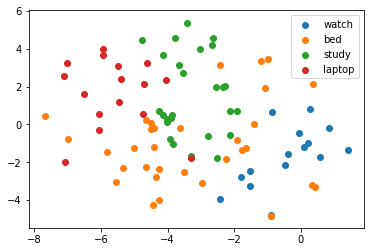

In [510]:
x, y, classes, _, _ = ds.generate_image_event_dataset(image_data, print_data, len(cams), img2vec, augs=1)
plot(x, y, classes)

90 90
180 180 90 180
0/5
1/5
2/5
3/5
4/5
0/900
10/900
20/900
30/900
40/900
50/900
60/900
70/900
80/900
90/900
100/900
110/900
120/900
130/900
140/900
150/900
160/900
170/900
180/900
190/900
200/900
210/900
220/900
230/900
240/900
250/900
260/900
270/900
280/900
290/900
300/900
310/900
320/900
330/900
340/900
350/900
360/900
370/900
380/900
390/900
400/900
410/900
420/900
430/900
440/900
450/900
460/900
470/900
480/900
490/900
500/900
510/900
520/900
530/900
540/900
550/900
560/900
570/900
580/900
590/900
600/900
610/900
620/900
630/900
640/900
650/900
660/900
670/900
680/900
690/900
700/900
710/900
720/900
730/900
740/900
750/900
760/900
770/900
780/900
790/900
800/900
810/900
820/900
830/900
840/900
850/900
860/900
870/900
880/900
890/900
(900, 2052)
900 2


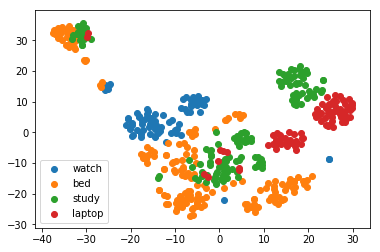

In [511]:
x, y, classes, _, _ = ds.generate_image_event_dataset(image_data, print_data, len(cams), img2vec, augs=5)
plot(x, y, classes)